In [1]:
import pickle
import sys
from pathlib import Path

import cv2
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage.io
from matplotlib.colors import ListedColormap
from skimage import exposure, measure
from tqdm.notebook import trange, tqdm, tqdm_notebook
from joblib import Parallel, delayed
import pickle

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# Import path
module_path = str(Path.cwd().parents[0])
if module_path not in sys.path:
    sys.path.append(module_path)

from config import *

In [4]:
module_path = str(Path.cwd().parents[0] / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as utils

In [5]:
csv_file = data_meta / "info_combined.csv"

# Read dataframe containing images information
df = pd.read_csv(csv_file)

In [6]:
def read_img(path):
    return skimage.io.imread(path)

def joblib_loop(task, pics):
    return Parallel(n_jobs=20)(delayed(task)(i) for i in pics)


def shift_crop(df, shift_dict, save=True):
    df_grouped = df.groupby(['Location'])
    for name, df_subset in tqdm(df_grouped):
        paths = df_subset.Path.tolist() 
        imgs = joblib_loop(read_img, paths)
        
        afts = df_subset.After_bleach.tolist()
        cycles = df_subset.Cycle.tolist()
        locations = df_subset.Location.tolist()
        channels = df_subset.Channel.tolist()
        
        imgs_shift_crop = []
        for idx, img in enumerate(imgs):
            location = locations[idx]
            shift_dict_subset = shift_dict[location]

            # Get max shift values
            max_shift_x = shift_dict_subset["max"]["max_shift_x"]
            min_shift_x = shift_dict_subset["max"]["min_shift_x"]
            max_shift_y = shift_dict_subset["max"]["max_shift_y"]
            min_shift_y = shift_dict_subset["max"]["min_shift_y"]
            
            if afts[idx] == True:
                aft = 'af'
            else:
                aft = 'norm'
            
            if cycles[idx] == 'Cycle1' and aft == 'norm':
                # Crop image
                res_cropped = img[max_shift_y:min_shift_y-1, max_shift_x:min_shift_x-1]

            else:
                # Aplly shift
                shift_x, shift_y = (
                    shift_dict_subset[cycles[idx]][aft]["shift_x"],
                    shift_dict_subset[cycles[idx]][aft]["shift_y"],
                )
                rows, cols = img.shape
                M = np.float32([[1, 0, shift_x], [0, 1, shift_y]])
                res = cv2.warpAffine(img, M, (cols, rows))

                # Crop image
                res_cropped = res[max_shift_y:min_shift_y-1, max_shift_x:min_shift_x-1]
            imgs_shift_crop.append(res_cropped)

        Parallel(n_jobs=10)(delayed(cv2.imwrite)(j, i) for i,j in zip(imgs_shift_crop, paths))

In [7]:
# shift_file = data_meta / 'shift.pkl'

# if not shift_file.is_file():
#     shift_dict = get_shift_between_cycle(df[df.Location < 64])
#     with open(data_meta / 'shift.pkl', 'wb') as file:
#         pickle.dump(shift_dict, file)
# else: 
#     with open(data_meta / 'shift.pkl', 'rb') as file:
#         shift_dict = pickle.load(file)

In [8]:
# shift_crop(df, shift_dict)

In [9]:
# df = df.query('Channel != "CH1" & After_bleach == False')
# df = df[df.Marker != 'Concanavalin A']
# df = df[df.Marker != 'Phalloidin']

In [10]:
df = df.query('After_bleach == False & Cycle == "Cycle8"')
# df = df[df.Marker.isin(['Cyclin D1', 'Hoeschst'])]
df = df[df.Marker.isin(['Hoeschst'])]

In [11]:
df

,Cycle,Location,Channel,Marker,Path,After_bleach
62,Cycle8,1,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
134,Cycle8,2,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
206,Cycle8,3,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
278,Cycle8,4,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
350,Cycle8,5,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
...,...,...,...,...,...,...
4238,Cycle8,59,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
4310,Cycle8,60,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
4382,Cycle8,61,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False
4454,Cycle8,62,CH1,Hoeschst,Y:\coskun-lab\Thomas\Spatial signaling\dataset...,False


In [12]:
# Load contours
contours_all, contours_nuclei_all = utils.load_pickle(data_meta / "contours.pickle")

  0%|          | 0/63 [00:00<?, ?it/s]

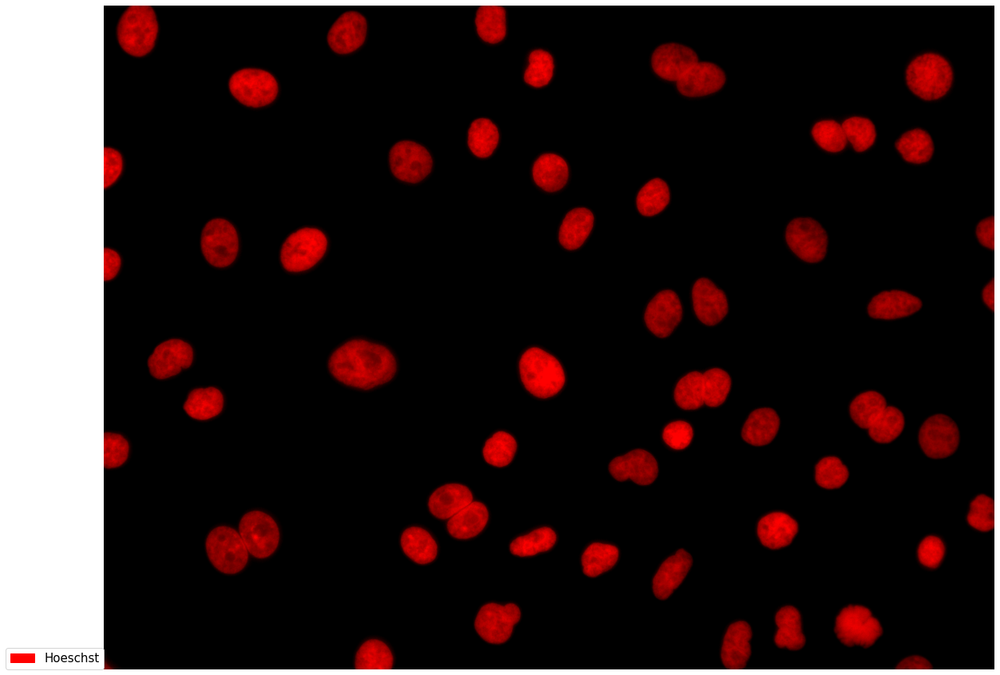

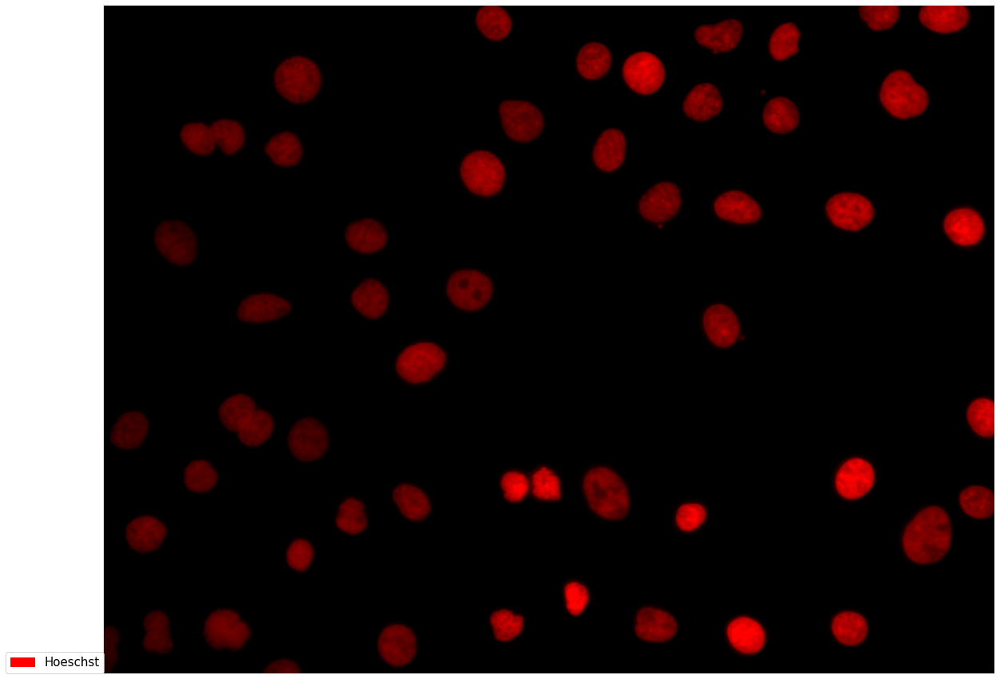

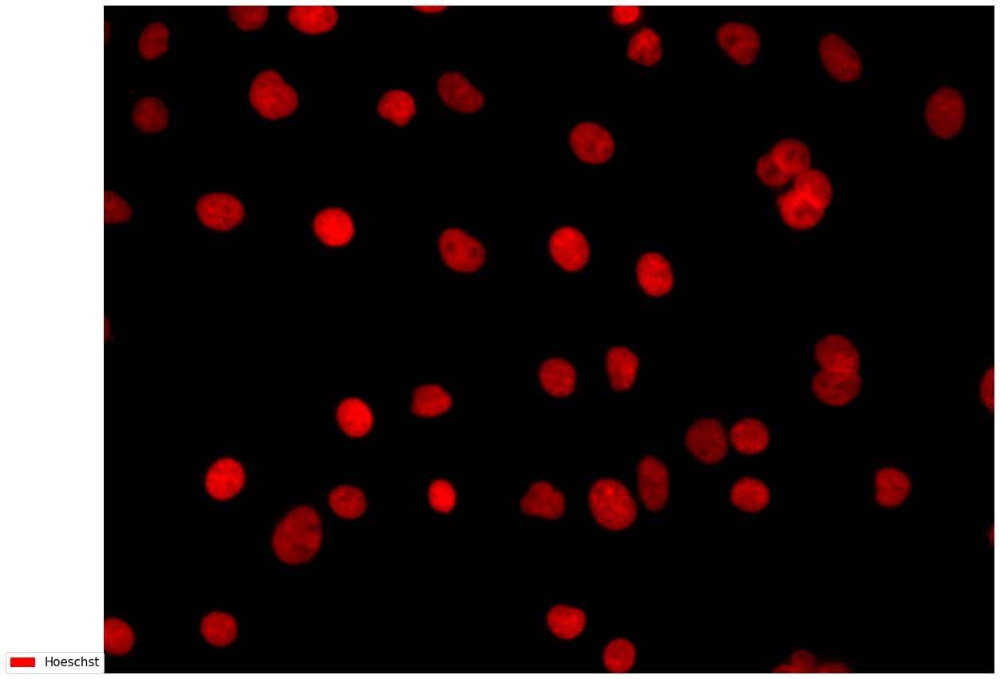

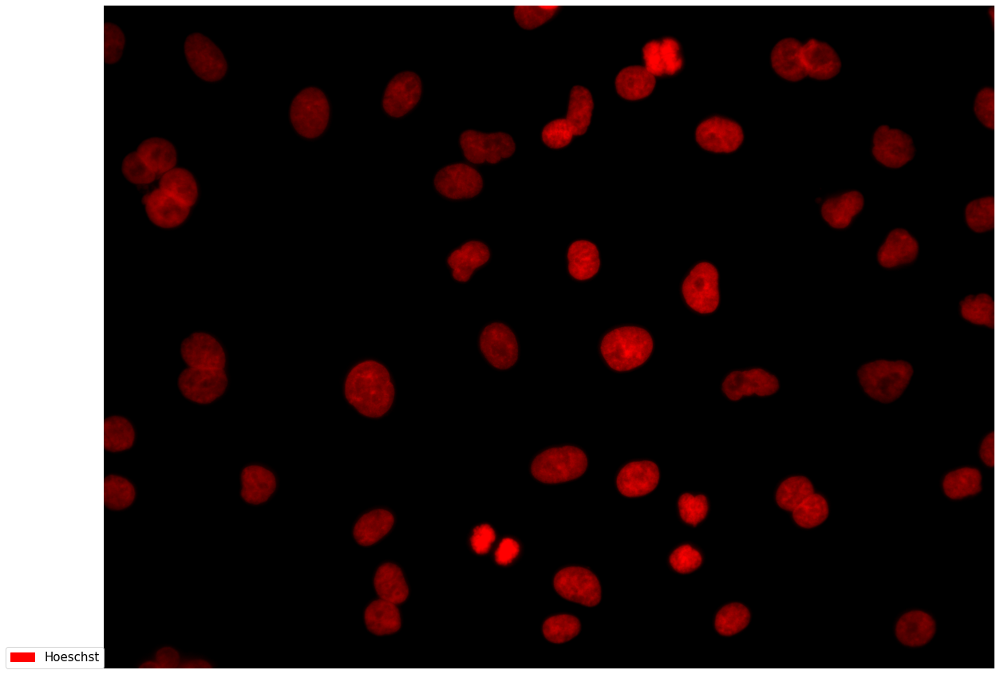

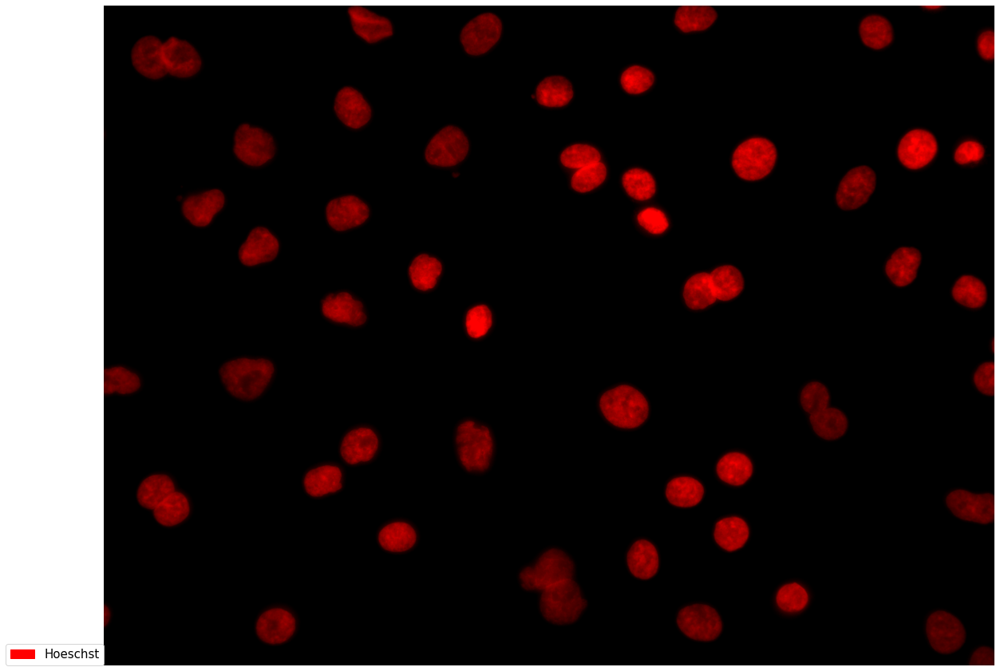

...

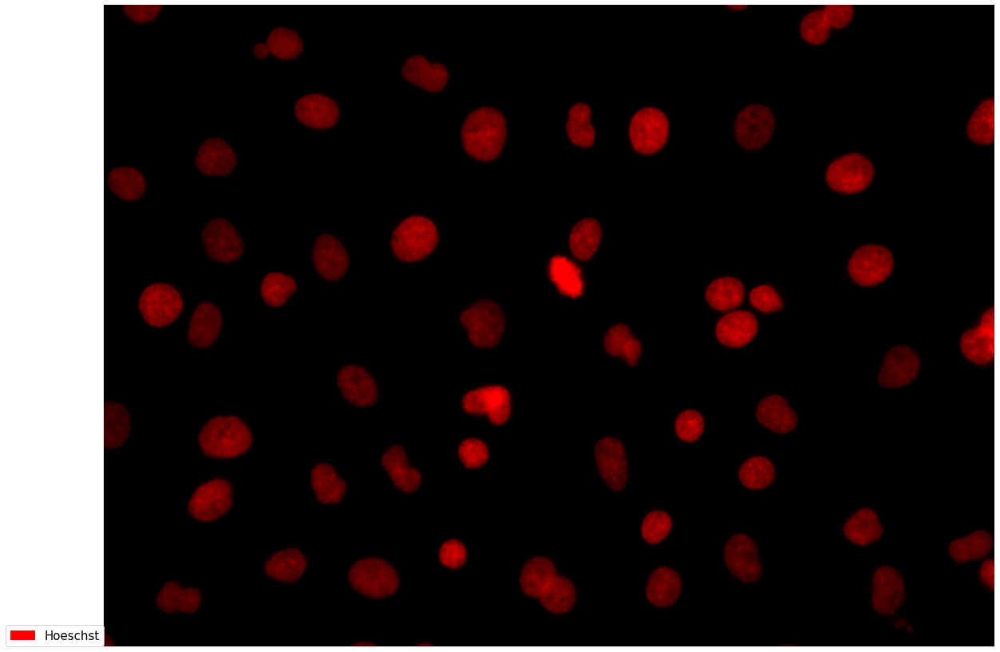

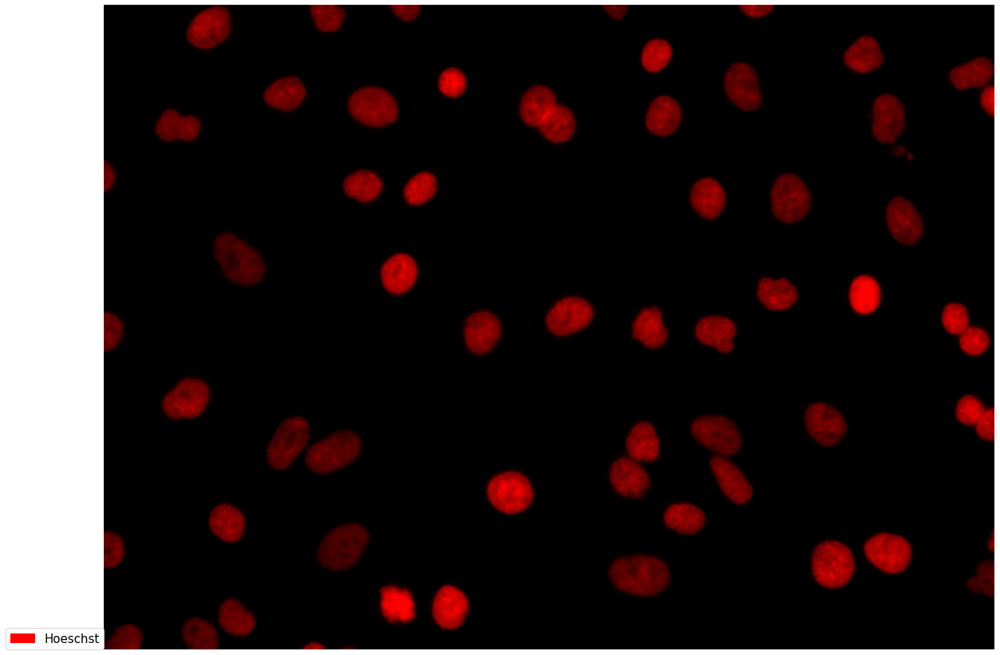

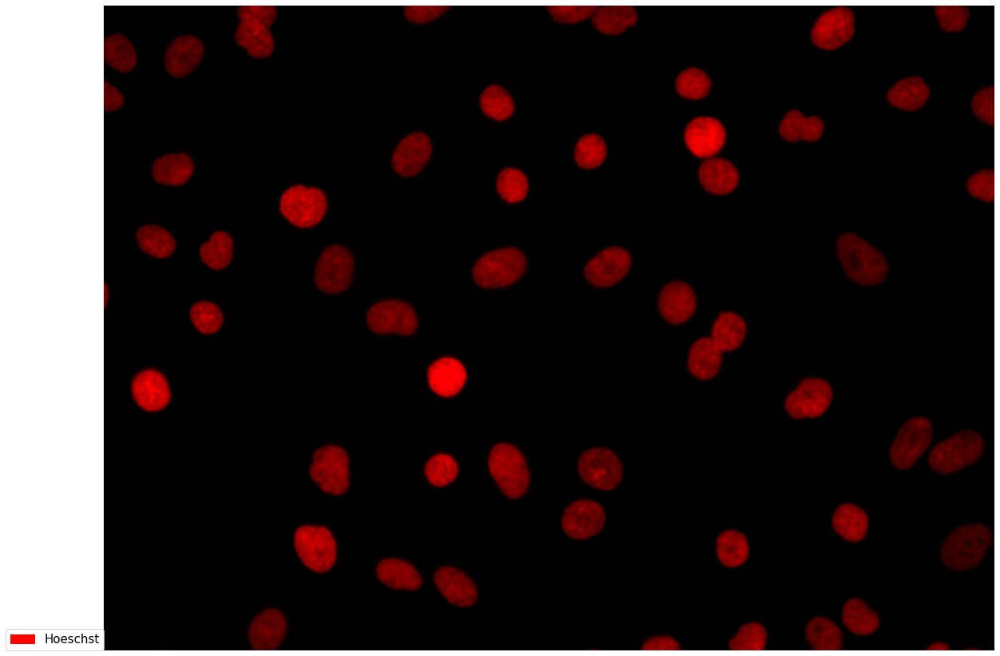

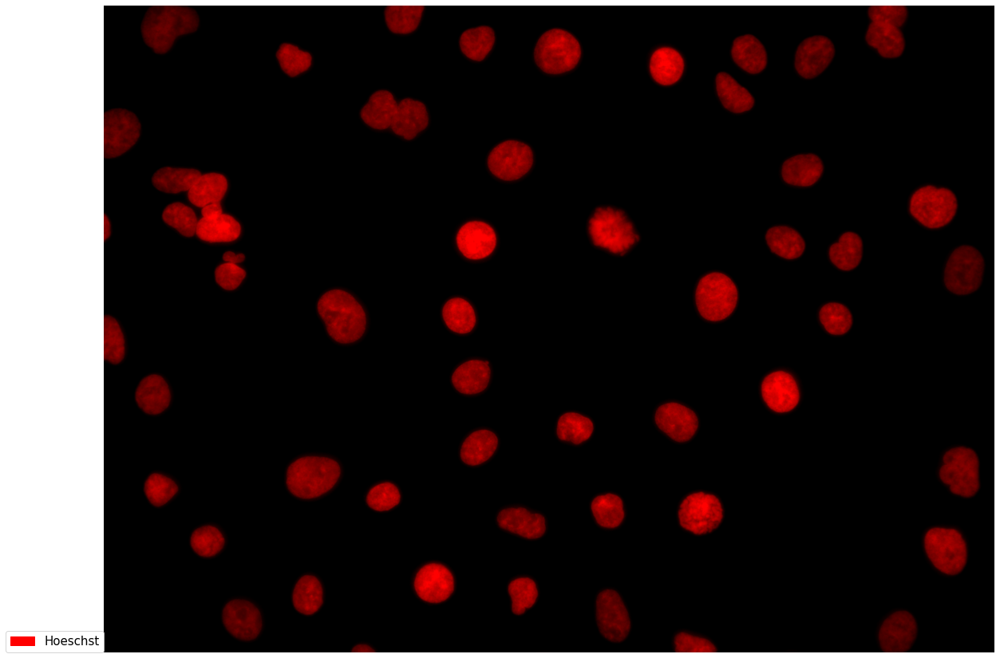

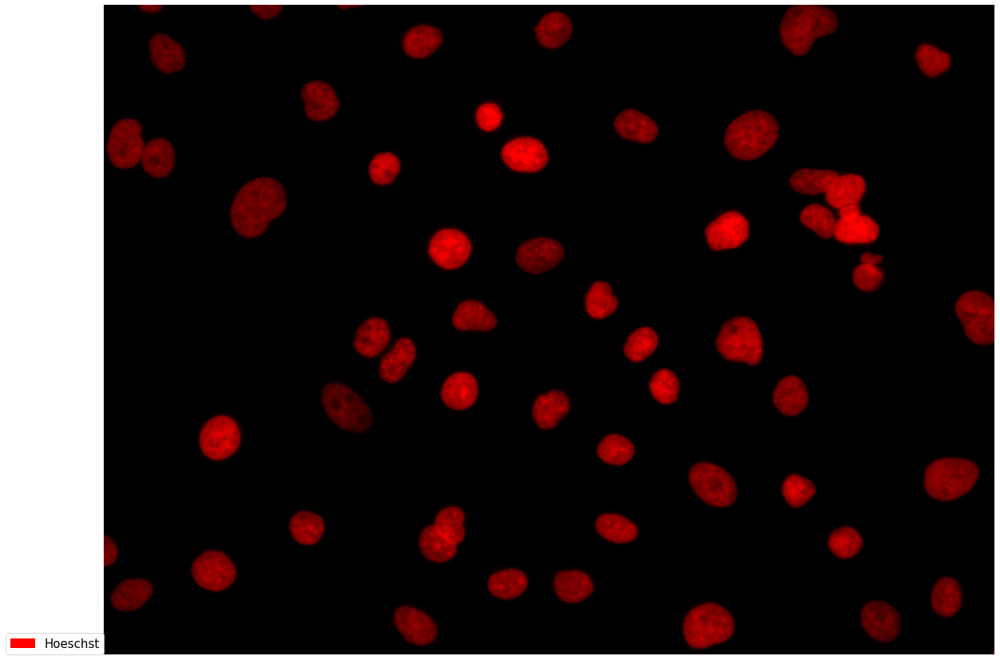

KeyboardInterrupt: 

In [13]:
grouped = df.groupby('Location')
n_group = 1  
vals = np.linspace(0, 0.8, n_group)
my_color = plt.cm.hsv(vals)

for name, df_group in tqdm(grouped):
    
    data = []
    markers = []
    for row in df_group.itertuples():
        img = skimage.io.imread(row.Path)
        p2, p98 = np.percentile(img, (0, 99.9))
        img = exposure.rescale_intensity(img, in_range=(p2, p98))
        data.append(img)
        markers.append(row.Marker)
    data = np.stack(data, axis=2)

    # Extract max intensity
    int_max = np.max(data, axis=(0, 1))
    int_range = [[0, 0] for i in range(len(df_group))]
    for idx, level in enumerate(int_max):
        int_range[idx] = [0, level]
    
    for n in range(len(df_group)//n_group):
        DEFAULT_CHANNELS = [n*n_group+i+1 for i in range(n_group)]
        RGB_MAP = {
            i: {"rgb": my_color[(i - 1) % 4][:3] * 255, "range": int_range[i - 1]}
            for i in DEFAULT_CHANNELS
        }
    
        fig, ax = plt.subplots(figsize=(20, 20))
        img = utils.convert_to_rgb(data, channels=DEFAULT_CHANNELS, rgb_map=RGB_MAP, vmax=255)
        ax.imshow(img)
        ax.axis("off")
        
#         # plot contour
#         utils.plot_contours(contours_all[str(name)], ax)
#         utils.plot_contours(contours_nuclei_all[str(name)], ax)

        # Color legend
        patches = [
            mpatches.Patch(color=RGB_MAP[i]["rgb"] / 255.0, label=markers[i - 1])
            for i in DEFAULT_CHANNELS
        ]
        ax.legend(
            handles=patches,
            bbox_to_anchor=(0, 0),
            loc="lower right",
            borderaxespad=0.0,
            fontsize=15,
        )
        plt.show()
#         plt.close(fig)
#         fig.savefig(figure_dir / 'multiplex_overlay' / f'{name}_{n}_multiplex_overlay.png', bbox_inches='tight')
    